In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from torch.autograd import Variable
import torch
import torch.utils
import torch.utils.data
from torch import nn

from tqdm import trange
import sys

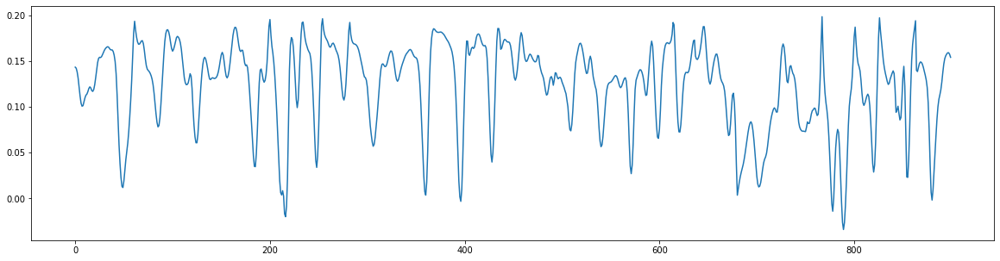

In [25]:
df = pd.read_csv("/home/g202103050/Documents/A.Rahman/Imputation/Data/Samples/DT3.csv", encoding='CP949')
df2 = pd.DataFrame()
df2["time"] = pd.to_datetime(df["DEPTH"])
df2["value"] = df["DT"]

plt.figure(figsize=(20,5))
plt.plot(df2["value"])
plt.show()

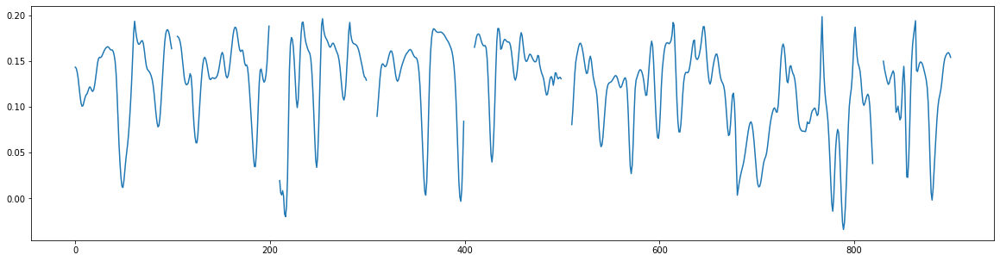

In [26]:
df = pd.read_csv("/home/g202103050/Documents/A.Rahman/Imputation/Data/Samples/DT3.csv", encoding='CP949')
df2 = pd.DataFrame()
df2["time"] = pd.to_datetime(df["DEPTH"])
df2["value"] = df["DT"]

missing_range = [(100,105),(200,210),(300,310),(400,410),(500,510), (820, 830)]

for start, end in missing_range:
    df2.iloc[start:end, 1] = np.nan

plt.figure(figsize=(20,5))
plt.plot(df2["value"])
plt.show()

In [27]:
df2.to_csv("/home/g202103050/Documents/A.Rahman/Imputation/Data/Samples/test_DT3.csv", index=False)

In [28]:
def makeBatch():
    df = pd.read_csv(path)
    min_max_scaler = MinMaxScaler()
    df = df[["time", "value"]]
    df["value"] = min_max_scaler.fit_transform(df["value"].values.reshape(-1,1))
    missing_list = df.isnull()["value"]
    data = df["value"].to_numpy()

    data_batch = []
    datas = []
    for index,val in enumerate(data):
        if missing_list[index]:
            datas=[]
            continue
        datas.append(val)         
        if len(datas)==window_size:
            data_batch.append(datas.copy())
            datas.pop(0)
    data_batch = np.array(data_batch)
    data_batch = data_batch.reshape(data_batch.shape[0], data_batch.shape[1], 1)
    return df,data, min_max_scaler, data_batch

In [29]:
class NAOMI(nn.Module):
    def __init__(self, params):
        super(NAOMI, self).__init__()

        self.params = params
        self.task = params['task']
        self.stochastic = (self.task == 'basketball')
        self.y_dim = params['y_dim']
        self.rnn_dim = params['rnn_dim']
        self.dims = {}
        self.n_layers = params['n_layers']
        self.networks = {}
        self.highest = params['highest']
        self.batch_size = params['batch']

        self.gru = nn.GRU(self.y_dim, self.rnn_dim, self.n_layers)
        self.back_gru = nn.GRU(self.y_dim + 1, self.rnn_dim, self.n_layers)
        
        step = 1
        while step <= self.highest:
            l = str(step)
            self.dims[l] = params['dec' + l + '_dim']
            dim = self.dims[l]
            
            curr_level = {}
            curr_level['dec'] = nn.Sequential(
                nn.Linear(2 * self.rnn_dim, dim),
                nn.ReLU())
            curr_level['mean'] = nn.Linear(dim, self.y_dim)
            if self.stochastic:
                curr_level['std'] = nn.Sequential(
                    nn.Linear(dim, self.y_dim),
                    nn.Softplus())
            curr_level = nn.ModuleDict(curr_level)

            self.networks[l] = curr_level
            
            step = step * 2

        self.networks = nn.ModuleDict(self.networks)

    def forward(self, data, ground_truth):
        # data: seq_length * batch * 11
        # ground_truth: seq_length * batch * 10
        h = Variable(torch.zeros(self.n_layers, self.batch_size, self.rnn_dim))
        h_back = Variable(torch.zeros(self.n_layers, self.batch_size, self.rnn_dim))
        if self.params['cuda']:
            h, h_back = h.cuda(), h_back.cuda()
        
        loss = 0.0
        h_back_dict = {}
        count = 0
        
        for t in range(data.shape[0] - 1, 0, -1):
            h_back_dict[t+1] = h_back
            state_t = data[t]
            _, h_back = self.back_gru(state_t.unsqueeze(0), h_back)
            
        for t in range(data.shape[0]):
            state_t = ground_truth[t]
            _, h = self.gru(state_t.unsqueeze(0), h)
            count += 1
            for l, dim in self.dims.items():
                step_size = int(l)
                curr_level = self.networks[str(step_size)] 
                if t + 2 * step_size <= data.shape[0]:
                    next_t = ground_truth[t+step_size]
                    h_back = h_back_dict[t+2*step_size]
                    
                    dec_t = curr_level['dec'](torch.cat([h[-1], h_back[-1]], 1))
                    dec_mean_t = curr_level['mean'](dec_t)
                    
                    if self.stochastic:
                        dec_std_t = curr_level['std'](dec_t)
                        loss += nll_gauss(dec_mean_t, dec_std_t, next_t)
                    else:
                        loss += torch.sum((dec_mean_t - next_t).pow(2))

        return loss / count / data.shape[1]

    def sample(self, data_list, batch_size = None):
        if not batch_size:
            batch_size = self.batch_size
        # data_list: seq_length * (1 * batch * 11)
        ret = []
        seq_len = len(data_list)
        h = Variable(torch.zeros(self.params['n_layers'], batch_size, self.rnn_dim))
        if self.params['cuda']:
            h = h.cuda()
        
        h_back_dict = {}
        h_back = Variable(torch.zeros(self.params['n_layers'], batch_size, self.rnn_dim))
        if self.params['cuda']:
            h_back = h_back.cuda()  
        for t in range(seq_len - 1, 0, -1):
            h_back_dict[t+1] = h_back
            state_t = data_list[t]
            _, h_back = self.back_gru(state_t, h_back)
        
        curr_p = 0
        _, h = self.gru(data_list[curr_p][:, :, 1:], h)
        while curr_p < seq_len - 1:
            if data_list[curr_p + 1][0, 0, 0] == 1:
                curr_p += 1
                _, h = self.gru(data_list[curr_p][:, :, 1:], h)
            else:
                next_p = curr_p + 1
                while next_p < seq_len and data_list[next_p][0, 0, 0] == 0:
                    next_p += 1
                
                step_size = 1
                while curr_p + 2 * step_size <= next_p and step_size <= self.highest:
                    step_size *= 2
                step_size = step_size // 2
                
                self.interpolate(data_list, curr_p, h, h_back_dict, step_size)
        
        return torch.cat(data_list, dim=0)[:, :, 1:]

    def interpolate(self, data_list, curr_p, h, h_back_dict, step_size):
        #print("interpolating:", len(ret), step_size)
        h_back = h_back_dict[curr_p + 2 * step_size]
        curr_level = self.networks[str(step_size)]
        
        dec_t = curr_level['dec'](torch.cat([h[-1], h_back[-1]], 1))
        dec_mean_t = curr_level['mean'](dec_t)
        if self.stochastic:
            dec_std_t = curr_level['std'](dec_t)
            state_t = reparam_sample_gauss(dec_mean_t, dec_std_t)
        else:
            state_t = dec_mean_t
        
        added_state = state_t.unsqueeze(0)
        has_value = Variable(torch.ones(added_state.shape[0], added_state.shape[1], 1))
        if self.params['cuda']:
            has_value = has_value.cuda()
        added_state = torch.cat([has_value, added_state], 2)
        
        if step_size > 1:
            right = curr_p + step_size
            left = curr_p + step_size // 2
            h_back = h_back_dict[right+1]
            _, h_back = self.back_gru(added_state, h_back)
            h_back_dict[right] = h_back
            
            zeros = Variable(torch.zeros(added_state.shape[0], added_state.shape[1], self.y_dim + 1))
            if self.params['cuda']:
                zeros = zeros.cuda()
            for i in range(right-1, left-1, -1):
                _, h_back = self.back_gru(zeros, h_back)
                h_back_dict[i] = h_back
        
        data_list[curr_p + step_size] = added_state


def num_trainable_params(model):
    total = 0
    for p in model.parameters():
        count = 1
        for s in p.size():
            count *= s
        total += count
    return total


def nll_gauss(mean, std, x):
    pi = Variable(torch.DoubleTensor([np.pi]))
    if mean.is_cuda:
        pi = pi.cuda()
    nll_element = (x - mean).pow(2) / std.pow(2) + 2*torch.log(std) + torch.log(2*pi)
    
    return 0.5 * torch.sum(nll_element)


def reparam_sample_gauss(mean, std):
    eps = torch.DoubleTensor(std.size()).normal_()
    eps = Variable(eps)
    if mean.is_cuda:
        eps = eps.cuda()
    return eps.mul(std).add_(mean)

In [30]:
def run_epoch(train, model, exp_data, clip, optimizer=None, batch_size=64, num_missing=None, teacher_forcing=True):
    losses = []
    inds = np.random.permutation(exp_data.shape[0])
    
    i = 0
    while i + batch_size <= exp_data.shape[0]:
        ind = torch.from_numpy(inds[i:i+batch_size]).long()
        i += batch_size
        data = exp_data[ind]
    
        
        data = data.to(device)

        # change (batch, time, x) to (time, batch, x)
        data = Variable(data.transpose(0, 1))
        ground_truth = data.clone()
        if num_missing is None:
            #num_missing = np.random.randint(data.shape[0] * 18 // 20, data.shape[0])
            #num_missing = np.random.randint(data.shape[0] * 4 // 5, data.shape[0])
            num_missing = min(20, data.shape[0] - 1)
            #num_missing = 15
        missing_list = torch.from_numpy(np.random.choice(np.arange(1, data.shape[0]), num_missing, replace=False)).long()
        data[missing_list] = 0.0
        has_value = Variable(torch.ones(data.shape[0], data.shape[1], 1))
        has_value = has_value.to(device)
        has_value[missing_list] = 0.0

        data = torch.cat([has_value, data], 2)
        seq_len = data.shape[0]


        if teacher_forcing:
            batch_loss = model(data, ground_truth)
        else:
            data_list = []
            for j in range(seq_len):
                data_list.append(data[j:j+1])
            samples = model.sample(data_list)
            batch_loss = torch.mean((ground_truth - samples).pow(2))

        if train:
            optimizer.zero_grad()
            total_loss = batch_loss
            total_loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), clip)
            optimizer.step()
        
        losses.append(batch_loss.data.cpu().numpy())

    return np.mean(losses)

In [31]:
path = "/home/g202103050/Documents/A.Rahman/Imputation/Data/Samples/test_DT3.csv"
window_size = 49
df, data, scaler, data_batch = makeBatch()
model = None
use_gpu = torch.cuda.is_available()
device = torch.device("cuda") if use_gpu else torch.device("cpu")
result = None
pretrain_epochs = 200
clip = 1
start_lr = 0.0051
batch_size = 32

np.random.seed(123)
torch.manual_seed(123)
if use_gpu:
    torch.cuda.manual_seed_all(123)

params = {
    'task' : "--",
    'batch' : batch_size,
    'y_dim' : 1,
    'rnn_dim' : 50,
    'dec1_dim' : 50,
    'dec2_dim' : 100,
    'dec4_dim' : 100,
    'dec8_dim' : 100,
    'dec16_dim' : 100,
    'n_layers' : 2,
    'discrim_rnn_dim' : 128,
    'discrim_num_layers' : 2,
    'cuda' : use_gpu,
    'highest' : 8,
}

model = NAOMI(params).to(device)
params['total_params'] = num_trainable_params(model)
train_data = torch.Tensor(data_batch)

lr = start_lr
teacher_forcing = True

In [32]:
with trange(pretrain_epochs, file=sys.stdout) as tr:
    for e in tr:
        epoch = e+1
        if epoch == pretrain_epochs // 2:
            lr = lr / 2

        optimizer = torch.optim.Adam(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=lr)
        train_loss = run_epoch(True, model, train_data, clip, optimizer, batch_size = batch_size, teacher_forcing=teacher_forcing)
        tr.set_postfix(loss="{0:.3f}".format(train_loss))

100%|█████████████████████████████| 200/200 [04:18<00:00,  1.29s/it, loss=0.002]


In [33]:
def predict_result():
    test = data.copy()
    missing_list = np.where(pd.isnull(test))

    test[np.isnan(test)] = 0
    
    test = test.reshape(len(data),1,1)
    test = Variable(torch.Tensor(test).to(device))

    has_value = Variable(torch.ones(test.shape[0], test.shape[1], 1))
    has_value[missing_list] = 0.0
    has_value = has_value.to(device)
    data_test = torch.cat([has_value, test], 2)

    data_list = []
    for j in range(len(data)):
        data_list.append(data_test[j:j+1])
    samples = model.sample(data_list,1)
    result = samples[:,0,0].cpu().detach().numpy()

    result = scaler.inverse_transform(result.reshape(-1,1))
    return result


In [34]:
result = predict_result()

df["value"] = result
data_ori = scaler.inverse_transform(data.reshape(-1,1))

In [35]:
plt.figure(figsize=(20,5))
plt.plot(real["DT"], label="real", zorder=10)
plt.plot(data_ori, label="real", zorder=10)
plt.plot(result, label="predict")
plt.legend()
plt.show()

NameError: name 'real' is not defined

<Figure size 1440x360 with 0 Axes>

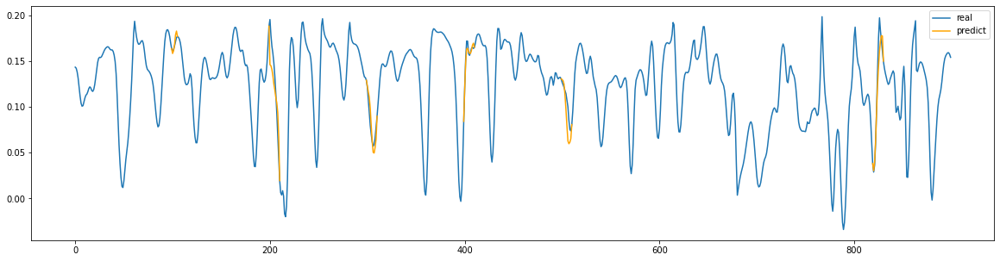

In [36]:
real = pd.read_csv("/home/g202103050/Documents/A.Rahman/Imputation/Data/Samples/DT3.csv",encoding='CP949')
plt.figure(figsize=(20,5))
plt.plot(real["DT"], label="real")
lb = "predict"
for start, end in missing_range:
    plt.plot(range(start-1,end+1), result[start-1:end+1], label=lb, color="orange")
    lb=None
plt.legend()
plt.show()

In [51]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 5), dpi=900)
plt.plot(real["DT"], label="Real")
lb = "Predict"
for start, end in missing_range:
    plt.plot(range(start - 1, end + 1), result[start - 1 : end + 1], label=lb, color="orange")
    lb = None
plt.legend()
plt.title("NAOMI Model - DT Log Imputation", fontsize=16)
plt.xlabel("Depth (m)", fontsize=12)
plt.ylabel("DT ((μs/ft)", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 5), dpi=900)
plt.plot(df["value"], label="Real", zorder=10)
plt.plot(result, label="Predict")
plt.legend()
plt.title("DT Log Imputation", fontsize=16)
plt.xlabel("Depth (m)", fontsize=12)
plt.ylabel("DT ((μs/ft) )", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

In [38]:
from sklearn.metrics import mean_absolute_error, r2_score

def MAPEval(y_pred, y_true):
    """Calculate Mean Absolute Percentage Error (MAPE)."""
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate R-squared and Mean Absolute Error
def calculate_metrics(y_pred, y_true):
    """
    Calculate MAPE, MAE, and R-squared between predictions and true values.

    Parameters:
    - y_pred: Array of predicted values
    - y_true: Array of actual values

    Returns:
    - A dictionary containing the MAPE, MAE, and R-squared values.
    """
    mape = MAPEval(y_pred, y_true)
    mae = mean_absolute_error(y_true, y_pred)
    r_squared = r2_score(y_true, y_pred)
    return {'MAPE': mape, 'MAE': mae, 'R2': r_squared}

# Example usage with real values and predicted results
realval = real["DT"].values

for start, end in missing_range:
    metrics = calculate_metrics(result[start:end, 0], realval[start:end])
    print(f"Length of section {end-start}: MAPE: {metrics['MAPE']:.3f}, MAE: {metrics['MAE']:.3f}, R2: {metrics['R2']:.3f}")


Length of section 5: MAPE: 2.291, MAE: 0.004, R2: 0.236
Length of section 10: MAPE: 22.060, MAE: 0.024, R2: 0.686
Length of section 10: MAPE: 12.604, MAE: 0.010, R2: 0.708
Length of section 10: MAPE: 2.355, MAE: 0.004, R2: 0.888
Length of section 10: MAPE: 15.225, MAE: 0.015, R2: 0.037
Length of section 10: MAPE: 8.927, MAE: 0.013, R2: 0.918


# GAN 적용

In [39]:
class Discriminator(nn.Module):
    def __init__(self, params):
        super().__init__()
        self.params = params
        
        self.hidden_dim = params['discrim_rnn_dim']
        self.action_dim = params['y_dim']
        self.state_dim = params['y_dim']
        self.gpu = params['cuda']
        self.num_layers = params['discrim_num_layers'] 

        self.gru = nn.GRU(self.state_dim, self.hidden_dim, self.num_layers)
        self.dense1 = nn.Linear(self.hidden_dim + self.action_dim, self.hidden_dim)
        self.dense2 = nn.Linear(self.hidden_dim, 1)
            
    def forward(self, x, a, h=None):  # x: seq * batch * 10, a: seq * batch * 10
        p, hidden = self.gru(x, h)   # p: seq * batch * 10
        p = torch.cat([p, a], 2)   # p: seq * batch * 20
        prob = torch.sigmoid(self.dense2(torch.nn.functional.relu(self.dense1(p))))    # prob: seq * batch * 1
        return prob

    def init_hidden(self, batch):
        return Variable(torch.zeros(self.num_layers, batch, self.hidden_dim))

In [40]:
def ones(*shape):
    return torch.ones(*shape).cuda() if use_gpu else torch.ones(*shape)

def zeros(*shape):
    return torch.zeros(*shape).cuda() if use_gpu else torch.zeros(*shape)
    
def update_discrim(discrim_net, optimizer_discrim, discrim_criterion, exp_states, exp_actions, \
                   states, actions, i_iter, dis_times, use_gpu, train = True):
    if use_gpu:
        exp_states, exp_actions, states, actions = exp_states.cuda(), exp_actions.cuda(), states.cuda(), actions.cuda()

    """update discriminator"""
    g_o_ave = 0.0
    e_o_ave = 0.0
    for _ in range(int(dis_times)):
        g_o = discrim_net(Variable(states), Variable(actions))
        e_o = discrim_net(Variable(exp_states), Variable(exp_actions))
        
        g_o_ave += g_o.cpu().data.mean()
        e_o_ave += e_o.cpu().data.mean()
        
        if train:
            optimizer_discrim.zero_grad()
            discrim_loss = discrim_criterion(g_o, Variable(zeros((g_o.shape[0], g_o.shape[1], 1)))) + \
                discrim_criterion(e_o, Variable(ones((e_o.shape[0], e_o.shape[1], 1))))
            discrim_loss.backward()
            optimizer_discrim.step()
    
    if dis_times > 0:
        return g_o_ave / dis_times, e_o_ave / dis_times

# train policy network
def update_policy(policy_net, optimizer_policy, discrim_net, discrim_criterion, \
                  states_var, actions_var, i_iter, use_gpu):
    optimizer_policy.zero_grad()
    g_o = discrim_net(states_var, actions_var)
    policy_loss = discrim_criterion(g_o, Variable(ones((g_o.shape[0], g_o.shape[1], 1))))
    policy_loss.backward()
    torch.nn.utils.clip_grad_norm_(policy_net.parameters(), 10)
    optimizer_policy.step()

# sample trajectories used in GAN training
def collect_samples_interpolate(policy_net, expert_data, use_gpu, i_iter, task, size=64, name="sampling_inter", draw=False, stats=False, num_missing=None):
    exp_ind = torch.from_numpy(np.random.choice(expert_data.shape[0], size)).long()
    data = expert_data[exp_ind].clone()
    seq_len = data.shape[1]
    #print(data.shape, seq_len)
    if use_gpu:
        data = data.cuda()
    data = Variable(data.transpose(0, 1))
    ground_truth = data.clone()
    
    if num_missing is None:
        num_missing = np.random.randint(seq_len * 4 // 5, seq_len)
        #num_missing = np.random.randint(seq_len * 18 // 20, seq_len)
        #num_missing = 40
    missing_list = torch.from_numpy(np.random.choice(np.arange(1, seq_len), num_missing, replace=False)).long()
    sorted_missing_list, _ = torch.sort(missing_list)
    # print("collect sample:", sorted_missing_list)
    data[missing_list] = 0.0
    has_value = Variable(torch.ones(seq_len, size, 1))
    if use_gpu:
        has_value = has_value.cuda()
    has_value[missing_list] = 0.0
    data = torch.cat([has_value, data], 2)
    data_list = []
    for i in range(seq_len):
        data_list.append(data[i:i+1])
    samples = policy_net.sample(data_list)
    
    states = samples[:-1, :, :]
    actions = samples[1:, :, :]
    exp_states = ground_truth[:-1, :, :]
    exp_actions = ground_truth[1:, :, :]

    # mod_stats = draw_and_stats(samples.data, name + '_' + str(num_missing), i_iter, task, draw=draw, compute_stats=stats, missing_list=missing_list)
    # exp_stats = draw_and_stats(ground_truth.data, name + '_expert' + '_' + str(num_missing), i_iter, task, draw=draw, compute_stats=stats, missing_list=missing_list)
    mod_stats = 0
    exp_stats = 0
    return exp_states.data, exp_actions.data, ground_truth.data, states, actions, samples.data, mod_stats, exp_stats

In [41]:
discrim_net = Discriminator(params).to(device)

In [42]:
policy_learning_rate = 3e-6
discrim_learning_rate = 1e-3
# optimizer
optimizer_policy = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=policy_learning_rate)
optimizer_discrim = torch.optim.Adam(discrim_net.parameters(), lr=discrim_learning_rate)
discrim_criterion = nn.BCELoss()
if use_gpu:
    discrim_criterion = discrim_criterion.cuda()

# stats
exp_p = []
win_exp_p = None
mod_p = []
win_mod_p = None
win_path_length = None
win_out_of_bound = None
win_step_change = None

In [43]:
pretrain_disc_iter = 2000 

# Pretrain Discriminator
progress = trange(pretrain_disc_iter)
for i in progress:
    exp_states, exp_actions, exp_seq, model_states_var, model_actions_var, model_seq, mod_stats, exp_stats = \
        collect_samples_interpolate(model, train_data, use_gpu, i, "task", size = batch_size, name="pretraining", draw=False, stats=False)
    model_states = model_states_var.data
    model_actions = model_actions_var.data
    pre_mod_p, pre_exp_p = update_discrim(discrim_net, optimizer_discrim, discrim_criterion, exp_states, \
        exp_actions, model_states, model_actions, i, dis_times=3.0, use_gpu=use_gpu, train=True)
    progress.set_postfix_str(s="exp:{:.4f} | mod:{:.4f}".format(pre_exp_p.item(), pre_mod_p.item()))
    
    if pre_mod_p < 0.3:
        break

  8%|█▏             | 155/2000 [00:10<02:09, 14.27it/s, exp:0.5926 | mod:0.2958]


In [44]:
# GAN training
log_interval = 5
max_iter_num = 1000
progress = trange(max_iter_num)
for i_iter in progress:
    exp_states, exp_actions, exp_seq, model_states_var, model_actions_var, model_seq, mod_stats, exp_stats = \
        collect_samples_interpolate(model, train_data, use_gpu, i_iter, "task", size = batch_size, draw=False, stats=False)
    model_states = model_states_var.data
    model_actions = model_actions_var.data
    
    # update discriminator
    mod_p_epoch, exp_p_epoch = update_discrim(discrim_net, optimizer_discrim, discrim_criterion, exp_states, exp_actions, model_states, model_actions, i_iter, dis_times=3.0, use_gpu=use_gpu, train=True)
    exp_p.append(exp_p_epoch)
    mod_p.append(mod_p_epoch)
    
    # update policy network
    if i_iter > 3 and mod_p[-1] < 0.8:
        update_policy(model, optimizer_policy, discrim_net, discrim_criterion, model_states_var, model_actions_var, i_iter, use_gpu)

    if i_iter % log_interval == 0:
        progress.set_postfix_str(s='{}\texp_p {:.3f}\tmod_p {:.3f}'.format(
            i_iter, exp_p[-1], mod_p[-1]))

100%|██████████| 1000/1000 [01:43<00:00,  9.67it/s, 995	exp_p 0.916	mod_p 0.083]


In [45]:
result = predict_result()

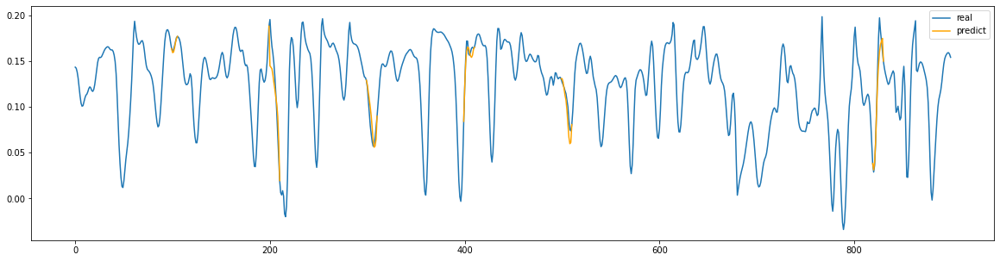

In [47]:
real = pd.read_csv("/home/g202103050/Documents/A.Rahman/Imputation/Data/Samples/DT3.csv",encoding='CP949')
plt.figure(figsize=(20,5))
plt.plot(real["DT"], label="real")
lb = "predict"
for start, end in missing_range:
    plt.plot(range(start-1,end+1), result[start-1:end+1], label=lb, color="orange")
    lb=None
plt.legend()
plt.show()

In [50]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 5), dpi=900)
plt.plot(real["DT"], label="Real")
lb = "Predict"
for start, end in missing_range:
    plt.plot(range(start - 1, end + 1), result[start - 1 : end + 1], label=lb, color="orange")
    lb = None
plt.legend()
plt.title("GAN Model - DT Log Imputation", fontsize=16)
plt.xlabel("Depth (m)", fontsize=12)
plt.ylabel("DT ((μs/ft)", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 5), dpi=900)
plt.plot(df["value"], label="Real", zorder=10)
plt.plot(result, label="Predict")
plt.legend()
plt.title("DT Log Imputation", fontsize=16)
plt.xlabel("Depth (m)", fontsize=12)
plt.ylabel("DT ((μs/ft) )", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

In [49]:
from sklearn.metrics import mean_absolute_error, r2_score

def calculate_metrics(y_pred, y_true):
    """
    Calculate the Mean Absolute Percentage Error (MAPE), Mean Absolute Error (MAE), and R-squared (R²) 
    between the predicted and actual values.
    
    Parameters:
    - y_pred: Array of predicted values.
    - y_true: Array of actual (true) values.
    
    Returns:
    - A dictionary containing the MAPE, MAE, and R² values.
    """
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    mae = mean_absolute_error(y_true, y_pred)
    r_squared = r2_score(y_true, y_pred)
    return {'MAPE': mape, 'MAE': mae, 'R2': r_squared}

# Assume 'real' is a DataFrame that includes your actual DT values and 'result' contains the predicted values
realval = real["DT"].values

for start, end in missing_range:
    metrics = calculate_metrics(result[start:end, 0], realval[start:end])
    print("Length of section {}: MAPE: {:.3f}, MAE: {:.3f}, R2: {:.3f}".format(end - start, metrics['MAPE'], metrics['MAE'], metrics['R2']))


Length of section 5: MAPE: 1.109, MAE: 0.002, R2: 0.866
Length of section 10: MAPE: 19.914, MAE: 0.023, R2: 0.705
Length of section 10: MAPE: 14.979, MAE: 0.011, R2: 0.616
Length of section 10: MAPE: 3.498, MAE: 0.006, R2: 0.767
Length of section 10: MAPE: 10.442, MAE: 0.010, R2: 0.644
Length of section 10: MAPE: 8.320, MAE: 0.012, R2: 0.921


It got better after applying GAN.